In [135]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import contextily as cx
import shapely.geometry as sg
import seaborn as sns
import ast
import folium
import os
from tqdm import tqdm

%config InlineBackend.figure_format='retina'

Totale deformatie, gemiddeld over y en z. Snelheid gemiddeld per maand, gemiddeld over y en z.
Kansscore deformatie kade:
Deformatie y/z < 15 (mm), snelheid y/z <5 (mm/maand), kansscore 1 (groen)\
Deformatie y/z 15-25 (mm), snelheid y/z 5-10 (mm/maand), kansscore 2 (geel)\
Deformatie y/z 25-35 (mm), snelheid y/z 10-15 (mm/maand), kansscore 3 (oranje)\
Deformatie y/z > 35 (mm), snelheid y/z >15 (mm/maand), kansscore 4 (rood)


In [2]:
cpt = pd.read_csv('../Data/CPT_train_v2.csv', index_col=0)
objects = cpt.index

In [3]:
objects

Index(['BDG0101', 'BDG0202', 'DCG0101', 'DCG0202', 'DCG0302', 'GRW0101',
       'HEG0302', 'HEG0401', 'HEG0802', 'HEG0901', 'KVV0602', 'KVV0702',
       'KZG0301', 'KZG0302', 'LLG0102', 'LLG0202', 'LYG0501', 'LYG0601',
       'NHG0201', 'OVW0601', 'PRG0301', 'PRG0401', 'PRG0402', 'SIN0501',
       'SIN0502', 'SIN0601', 'SIN0602', 'SIN0701', 'WEG0201', 'WKN0101'],
      dtype='object')

In [4]:
Y_y = pd.read_csv('../Data/TargetY.csv', index_col=0)

In [5]:
Y_z = pd.read_csv('../Data/TargetZ.csv', index_col=0)

In [6]:
def_total_z = Y_z.iloc[:,4:].mean(axis=1)

In [7]:
Y_y.iloc[-1][Y_y.iloc[-1].last_valid_index()]

1.299999999901047

In [8]:
def_total_y = Y_y.iloc[:, 4:].apply(lambda x: x.loc[x.last_valid_index()], axis=1)
def_total_z = Y_z.iloc[:, 4:].apply(lambda x: x.loc[x.last_valid_index()], axis=1)

In [9]:
def_speed_y = Y_y.iloc[:,4:].diff(axis=1).mean(axis=1)
def_speed_z = Y_z.iloc[:,4:].diff(axis=1).mean(axis=1)

In [10]:
def_speed_z.min()

-0.45135135135481236

In [11]:
df_agg_values = pd.DataFrame({'total_y':def_total_y, 'total_z':def_total_z, 'speed_y':def_speed_y, 'speed_z':def_speed_z})

In [12]:
df_agg_values['X_coordinate'] = Y_y['X_coordinate']
df_agg_values['Y_coordinate'] = Y_y['Y_coordinate']

In [13]:
df_agg_values['RiskScore'] = 1

In [14]:
medium_risk = df_agg_values[(df_agg_values['total_y'].abs() >= 15) | (df_agg_values['total_z'].abs() >= 15) | \
             (df_agg_values['speed_y'].abs() >= 5) | (df_agg_values['speed_z'].abs() >= 5)].index
high_risk = df_agg_values[(df_agg_values['total_y'].abs() >= 25) | (df_agg_values['total_z'].abs() >= 25) | \
             (df_agg_values['speed_y'].abs() >= 10) | (df_agg_values['speed_z'].abs() >= 10)].index
acute_risk = df_agg_values[(df_agg_values['total_y'].abs() > 35) | (df_agg_values['total_z'].abs() > 35) | \
             (df_agg_values['speed_y'].abs() > 15) | (df_agg_values['speed_z'].abs() > 15)].index

In [15]:
df_agg_values.loc[medium_risk, 'RiskScore'] = 2
df_agg_values.loc[high_risk, 'RiskScore'] = 3
df_agg_values.loc[acute_risk, 'RiskScore'] = 4

Deformatie y/z < 15 (mm), snelheid y/z <5 (mm/maand), kansscore 1 (groen)\
Deformatie y/z 15-25 (mm), snelheid y/z 5-10 (mm/maand), kansscore 2 (geel)\
Deformatie y/z 25-35 (mm), snelheid y/z 10-15 (mm/maand), kansscore 3 (oranje)\
Deformatie y/z > 35 (mm), snelheid y/z >15 (mm/maand), kansscore 4 (rood)

In [16]:
df_agg_values['RiskScore'].unique()

array([1, 2, 3, 4], dtype=int64)

In [17]:
df_agg_values = df_agg_values[df_agg_values['X_coordinate'] > 100000]

In [18]:
# train_agg_values = pd.read_csv('../Data/ARK_risk_scores.csv', index_col=0) 
# df_agg_values = df_agg_values[df_agg_values.index.isin(train_agg_values.index)]

In [19]:
df_agg_values['points'] = gpd.points_from_xy(df_agg_values['X_coordinate'], df_agg_values['Y_coordinate'])
gdf_agg = gpd.GeoDataFrame(df_agg_values, crs="EPSG:28992", geometry=df_agg_values['points'])
gdf_agg = gdf_agg.to_crs("EPSG: 4326")

In [20]:
gdf_agg['RiskScore'].unique()

array([1, 2, 3, 4], dtype=int64)

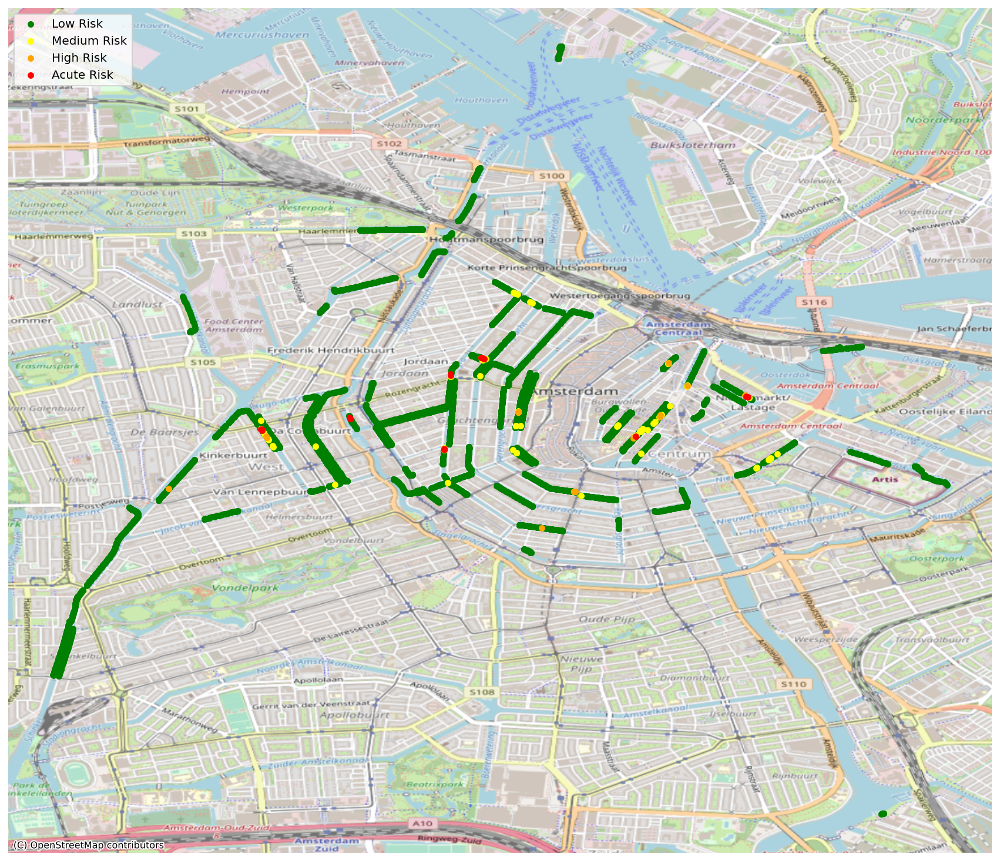

In [21]:
fig, ax = plt.subplots(figsize=(15,15))

gdf_agg[gdf_agg['RiskScore'] == 1].plot(ax=ax, color='g', markersize=20, label='Low Risk')
gdf_agg[gdf_agg['RiskScore'] == 2].plot(ax=ax, color='yellow', markersize=20, label='Medium Risk')
gdf_agg[gdf_agg['RiskScore'] == 3].plot(ax=ax, color='orange', markersize=20, label='High Risk')
gdf_agg[gdf_agg['RiskScore'] == 4].plot(ax=ax, color='r', markersize=20, label='Acute Risk')

cx.add_basemap(ax=ax, source=cx.providers.OpenStreetMap.Mapnik, crs=gdf_agg.crs)
plt.legend(loc='upper left')
ax.axis('off')
plt.show()

In [22]:
df_sinkholes = pd.read_csv('../Data/Sinkholes.csv', index_col=0) 

In [23]:
df_sinkholes['points'] = gpd.points_from_xy(df_sinkholes['X_coordinate'], df_sinkholes['Y_coordinate'])
gdf = gpd.GeoDataFrame(df_sinkholes, crs="EPSG:28992", geometry=df_sinkholes['points'])
gdf = gdf.to_crs("EPSG: 4326")

In [140]:
gdf.drop(['points', 'geometry'], axis=1).to_csv('../Data/SinkholesCoordinates.csv', index=True)

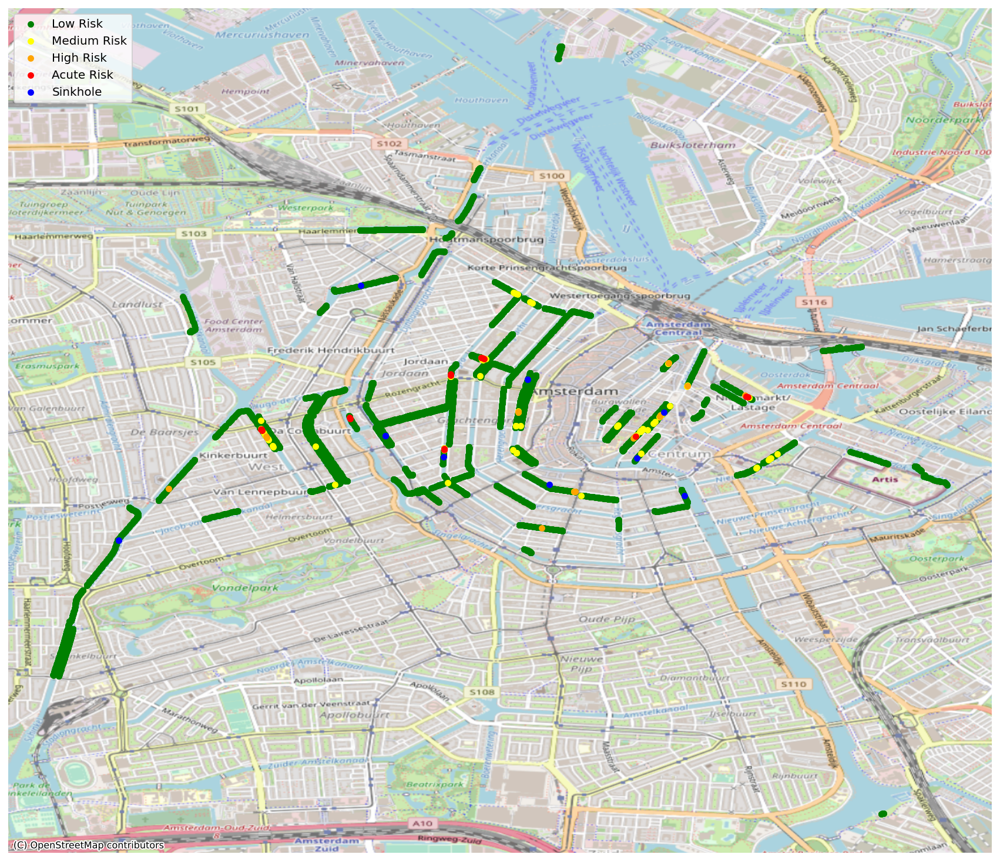

In [25]:
fig, ax = plt.subplots(figsize=(15,15))

gdf_agg[gdf_agg['RiskScore'] == 1].plot(ax=ax, color='g', markersize=20, label='Low Risk')
gdf_agg[gdf_agg['RiskScore'] == 2].plot(ax=ax, color='yellow', markersize=20, label='Medium Risk')
gdf_agg[gdf_agg['RiskScore'] == 3].plot(ax=ax, color='orange', markersize=20, label='High Risk')
gdf_agg[gdf_agg['RiskScore'] == 4].plot(ax=ax, color='r', markersize=20, label='Acute Risk')
gdf.plot(ax=ax, color='b', markersize=20, label='Sinkhole')

cx.add_basemap(ax=ax, source=cx.providers.OpenStreetMap.Mapnik, crs=gdf_agg.crs)
plt.legend(loc='upper left')
ax.axis('off')
plt.show()

In [ ]:
sat_ach = pd.read_csv('../Data/SatAch2.csv', index_col=0)
sat_ver = pd.read_csv('../Data/SatVer2.csv', index_col=0)
sat_hor = pd.read_csv('../Data/SatHor2.csv', index_col=0)

In [33]:
total_ach = sat_ach.iloc[:, :-1].apply(lambda x: x.loc[x.last_valid_index()], axis=1)
total_ver = sat_ver.iloc[:, :-1].apply(lambda x: x.loc[x.last_valid_index()], axis=1)
total_hor = sat_hor.iloc[:, :-1].apply(lambda x: x.loc[x.last_valid_index()], axis=1)

In [36]:
# def_speed_y = Y_y.iloc[:,4:].diff(axis=1).mean(axis=1)
# def_speed_z = Y_z.iloc[:,4:].diff(axis=1).mean(axis=1)
speed_ach = sat_ach.iloc[:,:-1].diff(axis=1).mean(axis=1)
speed_ver = sat_ver.iloc[:,:-1].diff(axis=1).mean(axis=1)
speed_hor = sat_hor.iloc[:,:-1].diff(axis=1).mean(axis=1)

In [79]:
df_agg = pd.DataFrame(index=speed_ach.index)
df_agg['total_ach'] = total_ach
df_agg['total_ver'] = total_ver
df_agg['speed_ach'] = speed_ach
df_agg['speed_ver'] = speed_ver

df_agg2 = pd.DataFrame(index=speed_hor.index)
df_agg2['total_hor'] = total_hor
df_agg2['speed_hor'] = speed_hor


In [83]:
df_agg['coords'] = sat_ach['WKT']
df_agg2['coords'] = sat_hor['WKT']

In [85]:
df_agg['RiskScore'] = 1

medium_risk = df_agg[(df_agg['total_ach'].abs() >= 15) | (df_agg['total_ver'].abs() >= 15) | \
             (df_agg['speed_ach'].abs() >= 5) | (df_agg['speed_ver'].abs() >= 5)].index
medium_risk2 = df_agg2[(df_agg2['total_hor'].abs() >= 15) | (df_agg2['speed_hor'].abs() >= 5)].index
high_risk = df_agg[(df_agg['total_ach'].abs() >= 25) | (df_agg['total_ver'].abs() >= 25) | \
             (df_agg['speed_ach'].abs() >= 10) | (df_agg['speed_ver'].abs() >= 10)].index
high_risk2 = df_agg2[(df_agg2['total_hor'].abs() >= 25) | (df_agg2['speed_hor'].abs() >= 10)].index
acute_risk = df_agg[(df_agg['total_ach'].abs() >= 35) | (df_agg['total_ver'].abs() >= 35) | \
             (df_agg['speed_ach'].abs() >= 15) | (df_agg['speed_ver'].abs() >= 15)].index
acute_risk2 = df_agg2[(df_agg2['total_hor'].abs() >= 35)].index

df_agg.loc[medium_risk, 'RiskScore'] = 2
df_agg.loc[medium_risk2, 'RiskScore'] = 2
df_agg.loc[high_risk, 'RiskScore'] = 3
df_agg.loc[high_risk2, 'RiskScore'] = 3
df_agg.loc[acute_risk, 'RiskScore'] = 4
df_agg.loc[acute_risk2, 'RiskScore'] = 4

In [87]:
df_agg.RiskScore.unique()

array([2, 4, 3, 1], dtype=int64)

In [ ]:
df_agg = pd.DataFrame({'total_ach':total_ach, 'total_ver':total_ver, 'total_hor':total_hor, 'speed_ach':speed_ach, 'speed_ver':speed_ver, 'speed_hor':speed_hor})

In [53]:
df_coords = Y_y.iloc[:,:3].set_index('objectid')
df_coords = df_coords.groupby(df_coords.index)['X_coordinate', 'Y_coordinate'].mean()

C:\Users\julia\AppData\Local\Temp/ipykernel_16100/3849370192.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df_coords = df_coords.groupby(df_coords.index)['X_coordinate', 'Y_coordinate'].mean()


In [54]:
df_agg['X_coordinate'] = df_coords['X_coordinate']
df_agg['Y_coordinate'] = df_coords['Y_coordinate']

In [55]:
df_agg['RiskScore'] = 1

medium_risk = df_agg[(df_agg['total_ach'].abs() >= 15) | (df_agg['total_ver'].abs() >= 15) | (df_agg['total_hor'].abs() >= 15) | \
             (df_agg['speed_ach'].abs() >= 5) | (df_agg['speed_ver'].abs() >= 5) | (df_agg['speed_hor'].abs() >= 5)].index
high_risk = df_agg[(df_agg['total_ach'].abs() >= 25) | (df_agg['total_ver'].abs() >= 25) | (df_agg['total_hor'].abs() >= 25) | \
             (df_agg['speed_ach'].abs() >= 10) | (df_agg['speed_ver'].abs() >= 10) | (df_agg['speed_hor'].abs() >= 10)].index
acute_risk = df_agg[(df_agg['total_ach'].abs() >= 35) | (df_agg['total_ver'].abs() >= 35) | (df_agg['total_hor'].abs() >= 35) | \
             (df_agg['speed_ach'].abs() >= 15) | (df_agg['speed_ver'].abs() >= 15) | (df_agg['speed_hor'].abs() >= 15)].index

df_agg.loc[medium_risk, 'RiskScore'] = 2
df_agg.loc[high_risk, 'RiskScore'] = 3
df_agg.loc[acute_risk, 'RiskScore'] = 4

In [130]:
# df_agg['points'] = gpd.points_from_xy(df_agg['X_coordinate'], df_agg['Y_coordinate'])
# gdf_hor = gpd.GeoDataFrame(df_sat_hor, geometry=gpd.GeoSeries.from_wkt(df_sat_hor['WKT']))
gdf_agg_sat = gpd.GeoDataFrame(df_agg, crs="EPSG:28992", geometry=gpd.GeoSeries.from_wkt(df_agg['coords']))
gdf_agg_sat['geometry'] = gdf_agg_sat['geometry'].buffer(10)
gdf_agg_sat = gdf_agg_sat.to_crs("EPSG: 4326")

In [121]:
gdf_agg_sat.RiskScore.unique()

array([2, 4, 3, 1], dtype=int64)

In [122]:
lowrisk = gdf_agg_sat[gdf_agg_sat['RiskScore'] == 1]

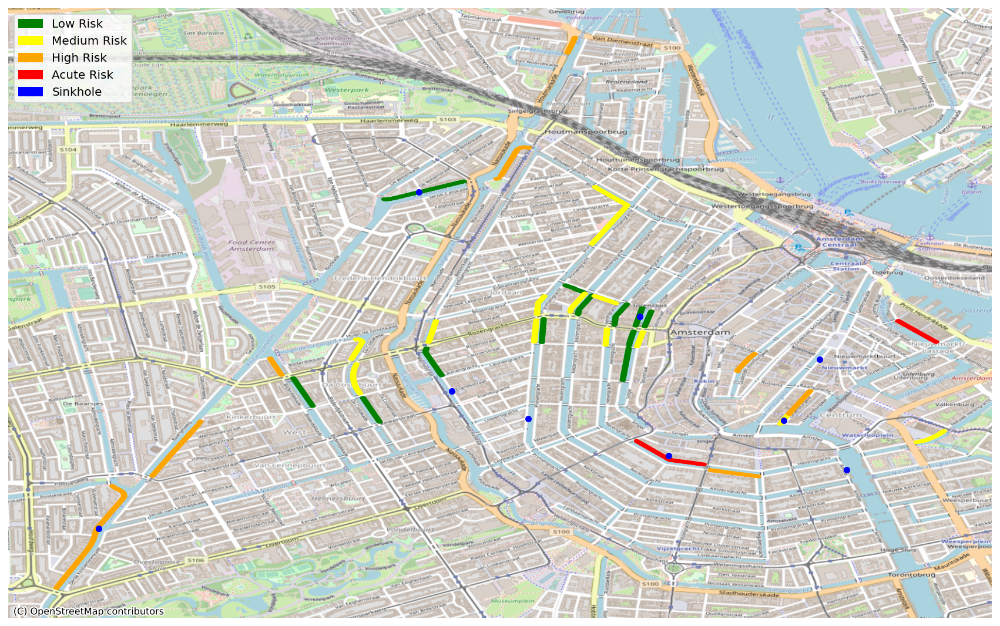

In [137]:
fig, ax = plt.subplots(figsize=(15,15))

low_risk_patch = mpatches.Patch(color='g', label='Low Risk')
medium_risk_patch = mpatches.Patch(color='yellow', label='Medium Risk')
high_risk_patch = mpatches.Patch(color='orange', label='High Risk')
acute_risk_patch = mpatches.Patch(color='r', label='Acute Risk')
sinkhole_marker = mpatches.Patch(color='b', label='Sinkhole')

gdf_agg_sat[gdf_agg_sat['RiskScore'] == 1].plot(ax=ax, color='g')
gdf_agg_sat[gdf_agg_sat['RiskScore'] == 2].plot(ax=ax, color='yellow')
gdf_agg_sat[gdf_agg_sat['RiskScore'] == 3].plot(ax=ax, color='orange')
gdf_agg_sat[gdf_agg_sat['RiskScore'] == 4].plot(ax=ax, color='r')
gdf.plot(ax=ax, color='b', markersize=20)

cx.add_basemap(ax=ax, source=cx.providers.OpenStreetMap.Mapnik, crs=gdf_agg.crs)

legend_handles = [low_risk_patch, medium_risk_patch, high_risk_patch, acute_risk_patch, sinkhole_marker]
plt.legend(handles=legend_handles, loc='upper left')

# plt.legend(loc='upper left')
ax.axis('off')
plt.show()